Pada Notebook ini saya menggunakan API untuk mendeteksi objek dengan menggunakan [the TensorFlow 2 Object Detection API](https://github.com/tensorflow/models/tree/master/research/object_detection).Kemudian saya menggunakan transfer learning dari SSD-Mobilnet untuk mentraining model lalu model yang sudah di training akan di konversi ke tensorflow lite.


# 1.&nbsp;Pengumpulan Gambar and melabelling data training

Sebelum ke tahap pemodelan langkah yang harus dilakukan yaitu mengumpulkan data dan memberikan label pada data tersebut. Data yang dilabeli akan digunakan untuk melakukan pendeteksian luka ringan. Untuk tools atau alat yang digunakan pelabelan yaitu **Labelimg**. Alat ini dapat di install pada link https://github.com/HumanSignal/labelImg. Pada proses pelabelan data yang diberi label sesuai dengan titik luka pada gambar seperti contoh berikut dibawah ini.![](https://i.ibb.co/Nm8FLvP/Screenshot-123.png). Setelah diberi label letakkan file gambar dan file hasil labelling kedalam folder yang sama.![](https://i.ibb.co/t2yV4pP/Screenshot-125.png)


#2.&nbsp;Install TensorFlow Object Detection Dependencies

Langkah pertama untuk proses modelling yaitu menginstall API Tensorflow Object Detection pada lingkungan google colab. untuk menginstall API nya didapatkan dari link berikut ini https://github.com/tensorflow/models.

In [ ]:
# Clone tensorflow models repository dari GitHub
!pip uninstall Cython -y # untuk mengatasi error "No module named 'object_detection'"
!git clone --depth 1 https://github.com/tensorflow/models

Found existing installation: Cython 3.0.6
Uninstalling Cython-3.0.6:
  Successfully uninstalled Cython-3.0.6
Cloning into 'models'...
remote: Enumerating objects: 4065, done.
remote: Counting objects: 100% (4065/4065), done.
remote: Compressing objects: 100% (3090/3090), done.
remote: Total 4065 (delta 1186), reused 1949 (delta 915), pack-reused 0
Receiving objects: 100% (4065/4065), 54.71 MiB | 22.92 MiB/s, done.
Resolving deltas: 100% (1186/1186), done.


In [ ]:
# Copy setup files kedalam models/research folder
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
#cp object_detection/packages/tf2/setup.py .

In [ ]:
# memodifikasi file setup.py untuk menginstall tf-models-official repository
import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official==2.8.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API
# Melakukan perbaikan library PyYAML karena google colab tidak dapat menginstall  PyYAML v5.4.1
!pip install pyyaml==5.3
!pip install /content/models/research/

# Mengharuskan downgrade to TF v2.8.0 due agar google colab kompatible terhadap bug TF v2.10 (as of 10/03/22)
!pip install tensorflow==2.8.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.2/268.2 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3-cp310-cp310-linux_x86_64.whl size=44244 sha256=470977ba9ea51d79863ce00dc02cf5a14b41fe8e4a6601f98f6b0b41007e36ca
  Stored in directory: /root/.cache/pip/wheels/0d/72/68/a263cfc14175636cf26bada99f13b735be1b60a11318e08bfc
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
llmx 0.0.15a0 requires cohere, which is not installed.
llmx 0.0.15a0 requires openai, which is not installed.
llmx 0.0.15a0 requires tiktoken, which is not installed.
dask 2023.8.1 requires pyyaml>=5.3.1, but you have pyyaml 5.3 which is incompatible.
distr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 40.1 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1


In [ ]:
# Jalankan Model Bulider Test file, Memastikan semua dapat berjalan dengan baik
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

# 3.&nbsp;Upload Image Dataset and Prepare Training Data

Pada tahap ini dilakukan pengunggahan data dan mempersiapkan untuk proses pelatihan dengan menggunakan tensorflow. Gambar yang telah di upload akan dibagi menjadi 3 bagian yaitu bagian training,testing dan validasi yaitu menjadi 80% untuk training, 10% untuk testing dan 10% untuk validasi. Kemudian ketika upload data maka data harus didalam satu folder yang sama antara data gambar dan data xml atau data label.
```
images.zip
-- images
  -- img1.jpg
  -- img1.xml
  -- img2.jpg
  -- img2.xml
  ...
```

### 3.1 Upload images


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

!cp /content/gdrive/MyDrive/wound.zip /content

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## 3.2 Split gambar menjadi train, validation, and test folder


In [ ]:
!mkdir /content/images
!unzip -q wound.zip -d /content/images/all
!mkdir /content/images/train; mkdir /content/images/validation; mkdir /content/images/test

Data akan di split menjadi 3 bagian yaitu training,validasi dan testing dengan bobot 80% untuk training, 10% untuk validasi dan 10% untuk testing

Disini saya menggunakan repository dari github EdjeElectronics untuk split data tersebut.

In [ ]:
!wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
!python train_val_test_split.py

--2023-12-10 05:22:16--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/train_val_test_split.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2803 (2.7K) [text/plain]
Saving to: ‘train_val_test_split.py.1’

train_val_test_spli 100%[===================>]   2.74K  --.-KB/s    in 0s      

2023-12-10 05:22:17 (51.4 MB/s) - ‘train_val_test_split.py.1’ saved [2803/2803]

Total images: 258
Images moving to train: 206
Images moving to validation: 25
Images moving to test: 27


## 3.3 Membuat Labelmap and TFRecords
Kemudian kita perlu membuat labelmap untuk pendeteksian dan mengkonversi gambar ke dalam format file data yang disebut TFRecords yang digunakan oleh Tensorflow untuk pelatihan. Dalam hal ini akan digunakan file python untuk menkonversi data secara otamatis kedalam format TFRecord. Sebelum menjalankan file python tersebut maka akan dibuat kan sebuah file berformat txt untuk menuliskan label pada data data gambar kita.

In [ ]:
### Membuat "labelmap.txt" file dengan kelas yang akan di deteksi.
%%bash
cat <<EOF >> /content/labelmap.txt
Luka Bakar
Luka Lecet
Luka Sayat
Luka Tusuk
EOF

In [ ]:
# Download data conversion scripts
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

--2023-12-10 05:22:31--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_csv.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1348 (1.3K) [text/plain]
Saving to: ‘create_csv.py’

create_csv.py       100%[===================>]   1.32K  --.-KB/s    in 0s      

2023-12-10 05:22:31 (84.5 MB/s) - ‘create_csv.py’ saved [1348/1348]

--2023-12-10 05:22:31--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githu

In [ ]:
# Membuat CSV data files and TFRecord files
!python3 create_csv.py
!python3 create_tfrecord.py --csv_input=images/train_labels.csv --labelmap=labelmap.txt --image_dir=images/train --output_path=train.tfrecord
!python3 create_tfrecord.py --csv_input=images/validation_labels.csv --labelmap=labelmap.txt --image_dir=images/validation --output_path=val.tfrecord

Successfully converted xml to csv.
Successfully converted xml to csv.
Successfully created the TFRecords: /content/train.tfrecord
Successfully created the TFRecords: /content/val.tfrecord


Kita akan menyimpan lokasi file TFRecord dan labelmap sebagai variabel sehingga kita dapat mereferensikannya nanti di google Colab ini.

In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

# 4.&nbsp;Set Up Training Configuration

In [ ]:
# Change the chosen_model variable to deploy different models available in the TF2 object detection zoo
chosen_model = 'ssd-mobilenet-v2-fpnlite-320'

MODELS_CONFIG = {
    'ssd-mobilenet-v2': {
        'model_name': 'ssd_mobilenet_v2_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz',
    },
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
    },
    'ssd-mobilenet-v2-fpnlite-320': {
        'model_name': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz',
    },
    # The centernet model isn't working as of 9/10/22
    #'centernet-mobilenet-v2': {
    #    'model_name': 'centernet_mobilenetv2fpn_512x512_coco17_od',
    #    'base_pipeline_file': 'pipeline.config',
    #    'pretrained_checkpoint': 'centernet_mobilenetv2fpn_512x512_coco17_od.tar.gz',
    #}
}

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']

Unduh file model yang telah dilatih sebelumnya dan file konfigurasi dengan mengeklik Play pada bagian berikut.

In [ ]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/mymodel
--2023-12-10 05:29:38--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 173.194.79.207, 108.177.96.207, 108.177.119.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|173.194.79.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  18.0MB/s    in 1.1s    

2023-12-10 05:29:39 (18.0 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

--2023-12-10 05:29:39--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.

Sekarang setelah kita mengunduh model dan file konfigurasi, kita perlu memodifikasi file konfigurasi dengan beberapa parameter pelatihan tingkat tinggi. Variabel-variabel berikut ini digunakan untuk mengontrol langkah-langkah pelatihan:

**num_steps**: Jumlah total langkah yang digunakan untuk melatih model. Jumlah yang baik untuk memulai adalah 40.000 langkah. Anda dapat menggunakan lebih banyak langkah jika Anda melihat metrik kerugian masih menurun pada saat pelatihan selesai. Semakin banyak langkah, semakin lama waktu yang dibutuhkan untuk berlatih. Latihan juga dapat dihentikan lebih awal jika kehilangan merata sebelum mencapai jumlah langkah yang ditentukan.
**batch_size**: Jumlah gambar yang akan digunakan per langkah pelatihan. Ukuran batch yang lebih besar memungkinkan model untuk dilatih dalam jumlah langkah yang lebih sedikit, tetapi ukurannya dibatasi oleh memori GPU yang tersedia untuk pelatihan. Dengan GPU yang digunakan dalam contoh Colab, 16 adalah angka yang baik untuk model SSD dan 4 baik untuk model EfficientDet.

Informasi pelatihan lainnya, seperti lokasi file model yang telah dilatih sebelumnya, file konfigurasi, dan jumlah total kelas juga ditetapkan pada langkah ini. Untuk mempelajari lebih lanjut tentang konfigurasi pelatihan dengan API Deteksi Objek TensorFlow, baca [artikel dari Neptunus] (https://neptune.ai/blog/tensorflow-object-detection-api-best-practices-to-training-evaluation-deployment).

In [ ]:
# Set training parameters for the model
num_steps = 40000

if chosen_model == 'efficientdet-d0':
  batch_size = 4
else:
  batch_size = 16

In [ ]:
# Set file locations and get number of classes for config file
pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 4


Selanjutnya, kita akan menulis ulang file config untuk menggunakan parameter pelatihan yang baru saja kita tentukan. Bagian kode berikut ini akan secara otomatis mengganti parameter yang diperlukan dalam file .config yang telah diunduh dan menyimpannya sebagai file "pipeline_file.config" khusus kita.

In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    if chosen_model == 'ssd-mobilenet-v2':
      s = re.sub('learning_rate_base: .8',
                 'learning_rate_base: .08', s)

      s = re.sub('warmup_learning_rate: 0.13333',
                 'warmup_learning_rate: .026666', s)

    # If using efficientdet-d0, use fixed_shape_resizer instead of keep_aspect_ratio_resizer (because it isn't supported by TFLite)
    if chosen_model == 'efficientdet-d0':
      s = re.sub('keep_aspect_ratio_resizer', 'fixed_shape_resizer', s)
      s = re.sub('pad_to_max_dimension: true', '', s)
      s = re.sub('min_dimension', 'height', s)
      s = re.sub('max_dimension', 'width', s)

    f.write(s)


/content/models/mymodel
writing custom configuration file


konten file konfigurasi

In [ ]:
# (Optional) Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

# SSD with Mobilenet v2 FPN-lite (go/fpn-lite) feature extractor, shared box
# predictor and focal loss (a mobile version of Retinanet).
# Retinanet: see Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from Imagenet classification checkpoint
# Train on TPU-8
#
# Achieves 22.2 mAP on COCO17 Val

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      multiscale_anchor_generator {

Terakhir, mari kita atur lokasi file konfigurasi dan direktori output model sebagai variabel sehingga kita dapat mereferensikannya ketika kita memanggil perintah training.

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# 5.&nbsp;Train Custom TFLite Detection Model

Kita siap untuk melatih model pendeteksian objek kita! Sebelum memulai pelatihan, mari kita muat sesi TensorBoard untuk memantau kemajuan pelatihan. Jalankan bagian kode berikut ini, dan sesi TensorBoard akan muncul di browser. Sesi ini belum akan menampilkan apa pun, karena kita belum memulai pelatihan. Setelah pelatihan dimulai, kembali dan klik tombol refresh untuk melihat kerugian model secara keseluruhan.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

Pelatihan model dilakukan dengan menggunakan skrip "model_main_tf2.py" dari TF Object Detection API. Pelatihan akan memakan waktu antara 2 hingga 6 jam, tergantung pada model, ukuran batch, dan jumlah langkah pelatihan. Kita telah mendefinisikan semua parameter dan argumen yang digunakan oleh `model_main_tf2.py` di bagian sebelumnya dari Colab ini. Cukup klik Play pada blok berikut ini untuk memulai pelatihan!



> *Catatan: Dibutuhkan beberapa menit bagi program untuk menampilkan pesan-pesan pelatihan, karena program ini hanya menampilkan log setiap 100 langkah. Jika sepertinya tidak ada yang terjadi, tunggu saja beberapa menit.*


In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

Jika Anda ingin menghentikan pelatihan lebih awal, cukup klik Stop beberapa kali atau klik kanan pada blok kode dan pilih "Interrupt Execution". Jika tidak, pelatihan akan berhenti dengan sendirinya setelah mencapai jumlah langkah pelatihan yang ditentukan.

# 6.&nbsp;Convert Model to TensorFlow Lite

Baiklah! Model kita sudah terlatih dan siap digunakan untuk mendeteksi objek. Pertama, kita perlu mengekspor grafik model (file yang berisi informasi tentang arsitektur dan bobot) ke format yang kompatibel dengan TensorFlow Lite. Kita akan melakukan ini dengan menggunakan skrip `export_tflite_graph_tf2.py`.

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}


/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutexC1Ev']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: libtensorflow_io.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io.so: undefined symbol: _ZNK10tensorflow4data11DatasetBase8FinalizeEPNS_15OpKernelContextESt8functionIFN3tsl8StatusOrINS5_4

Selanjutnya, kita akan mengambil grafik yang diekspor dan menggunakan modul `TFLiteConverter` untuk mengonversinya ke format FlatBuffer `.tflite`.

In [ ]:
# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

# 7.&nbsp;Test TensorFlow Lite Model and Calculate mAP

Kami telah melatih model khusus kami dan mengonversinya ke format TFLite. Tetapi, seberapa baik kinerjanya dalam mendeteksi objek dalam gambar? Di sinilah peran gambar yang kita sisihkan dalam folder **test**. Model tidak pernah melihat gambar uji selama pelatihan, sehingga kinerjanya pada gambar-gambar ini harus mewakili bagaimana kinerjanya pada gambar-gambar baru dari lapangan.

### 7.1 Inferensi gambar uji
Kode berikut ini mendefinisikan sebuah fungsi untuk menjalankan inferensi pada gambar uji. Fungsi ini memuat gambar, memuat model dan labelmap, menjalankan model pada setiap gambar, dan menampilkan hasilnya. Kode ini juga secara opsional menyimpan hasil deteksi sebagai file teks sehingga kita dapat menggunakannya untuk menghitung skor mAP model.

Kode ini didasarkan pada skrip [TFLite_detection_image.py] (https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py) dari [TensorFlow Lite Object Detection repository di GitHub] (https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi); jangan ragu untuk menggunakannya sebagai titik awal untuk aplikasi Anda.

Translated with www.DeepL.com/Translator (free version)

In [ ]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH)))
              xmax = int(min(imW,(boxes[i][3] * imW)))

              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])


      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()

      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

Blok berikutnya menetapkan jalur ke gambar uji dan model, lalu menjalankan fungsi inferensi. Jika Anda ingin menggunakan lebih dari 10 gambar, ubah variabel `images_to_test`. Klik play untuk menjalankan inferensi!

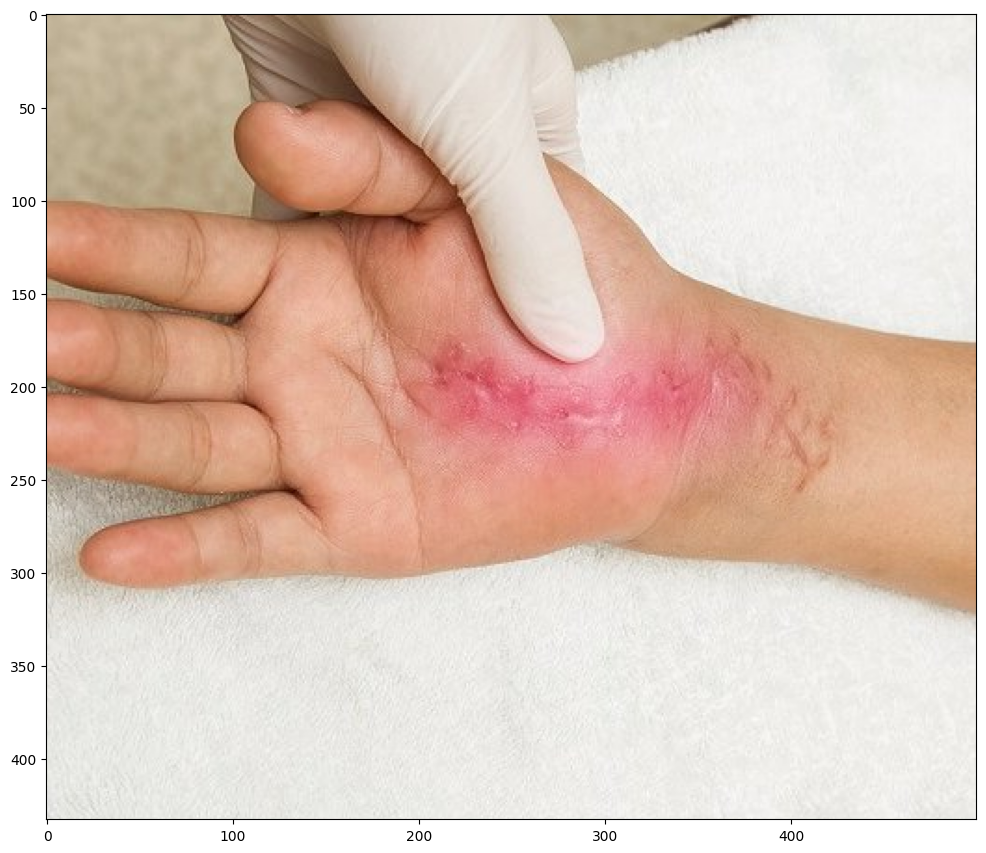

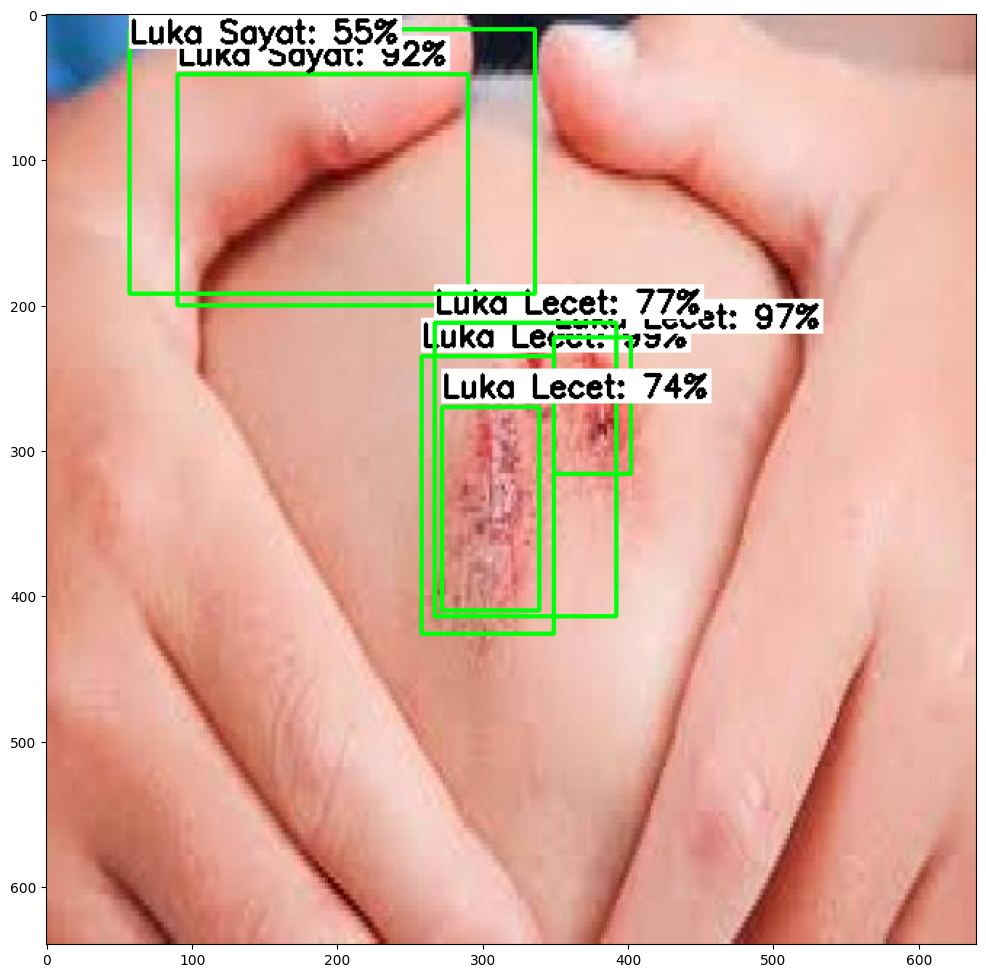

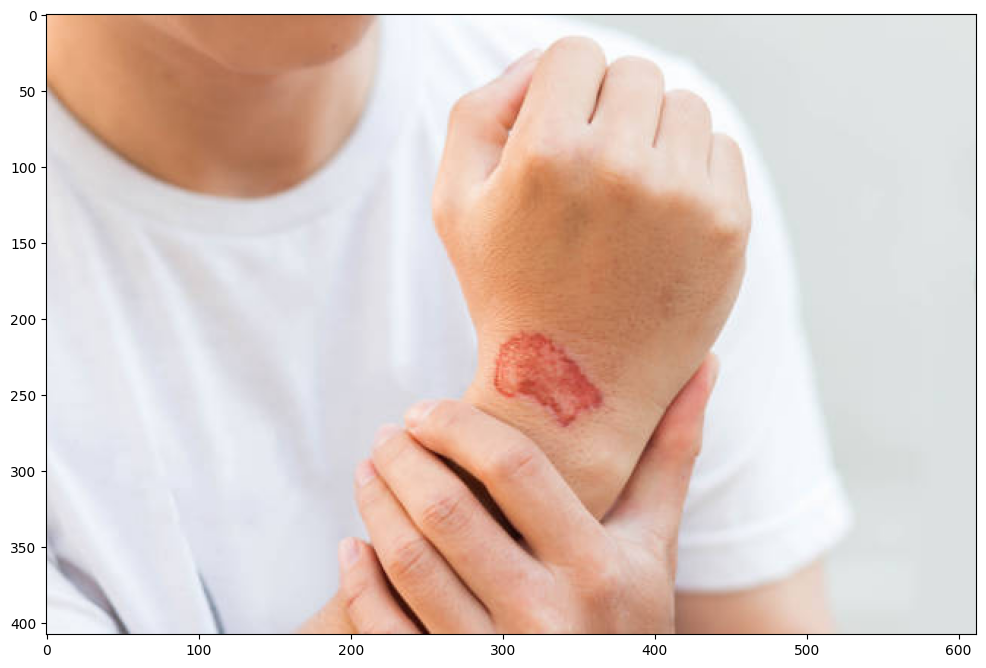

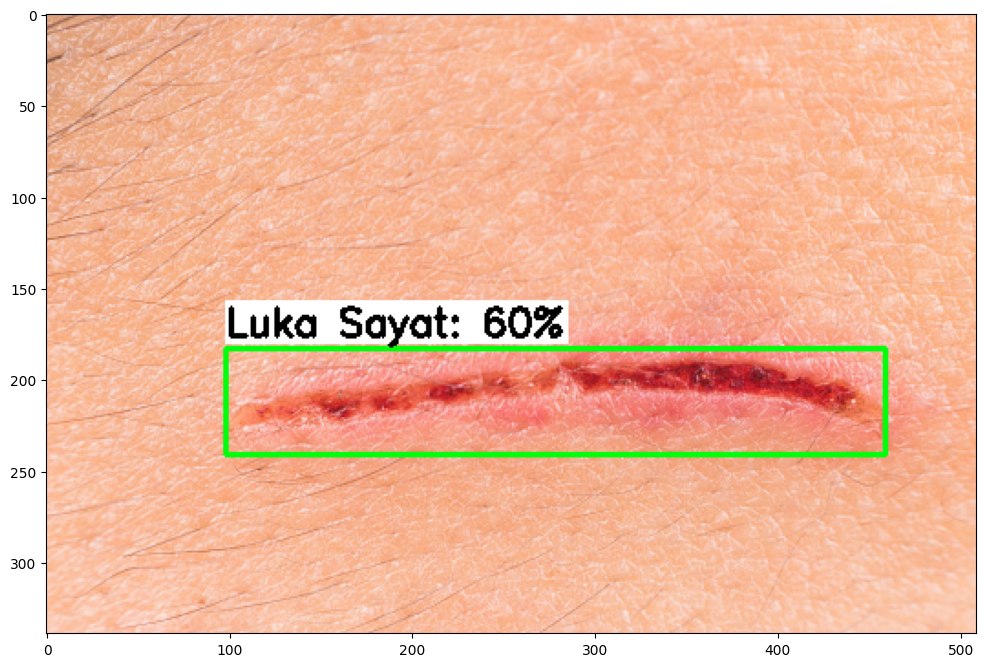

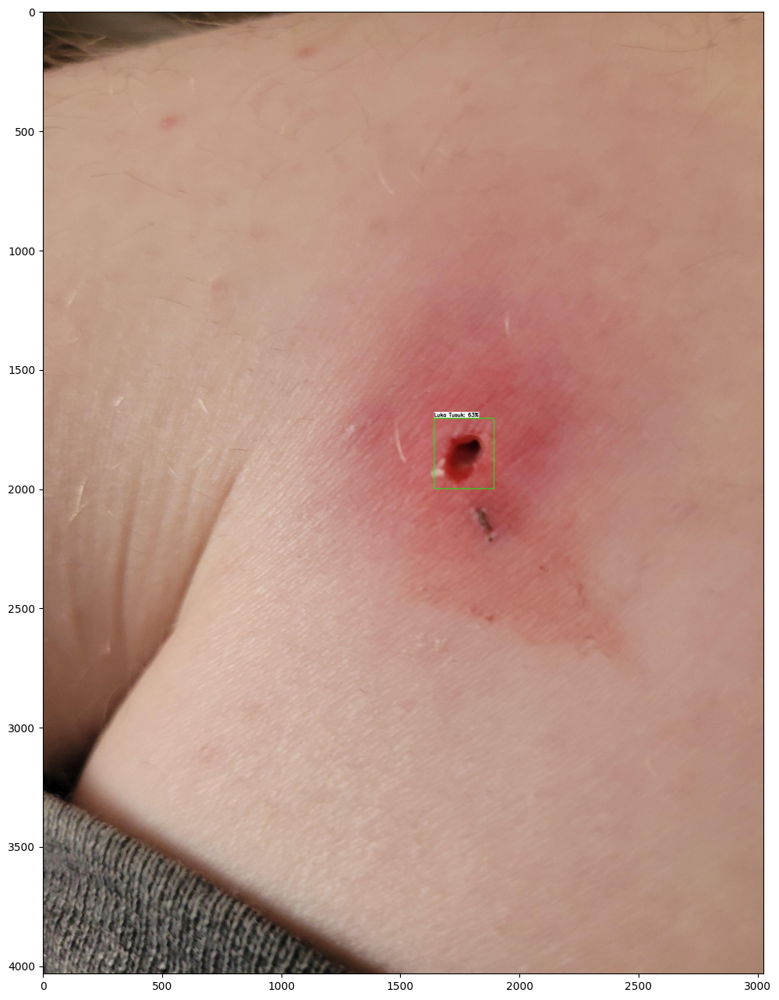

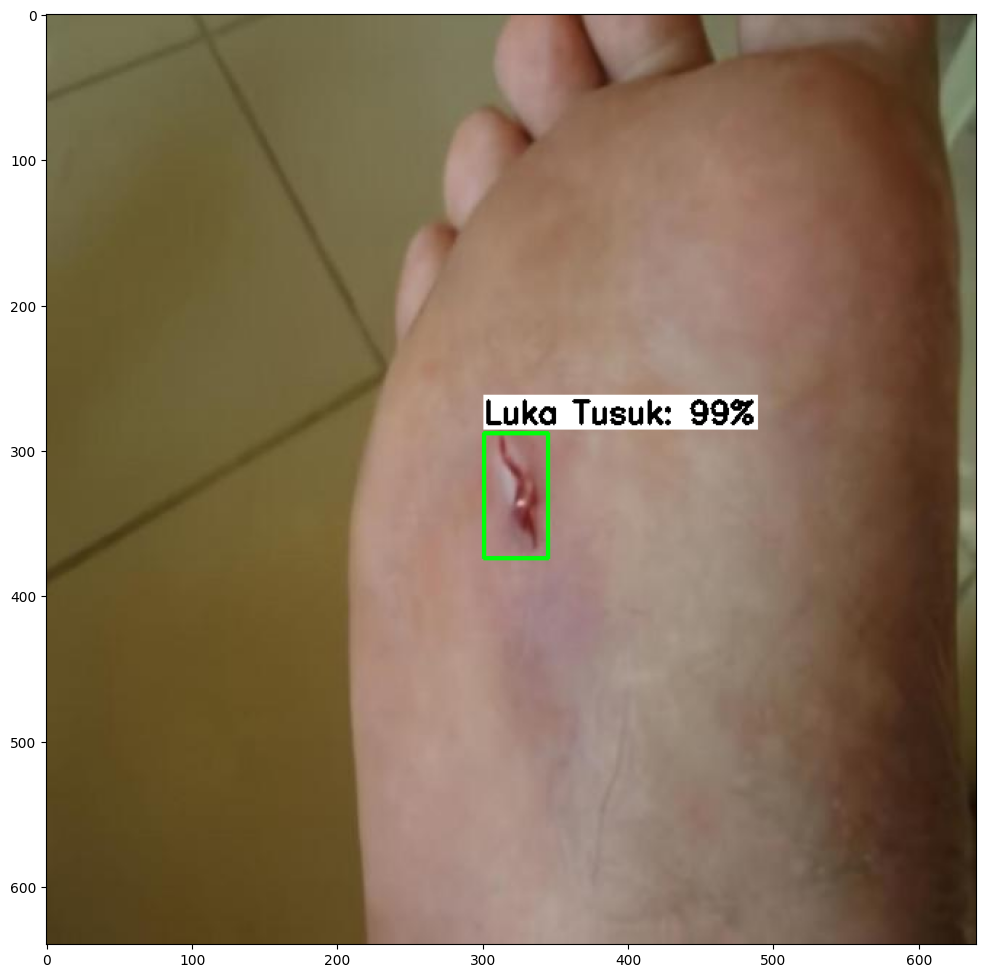

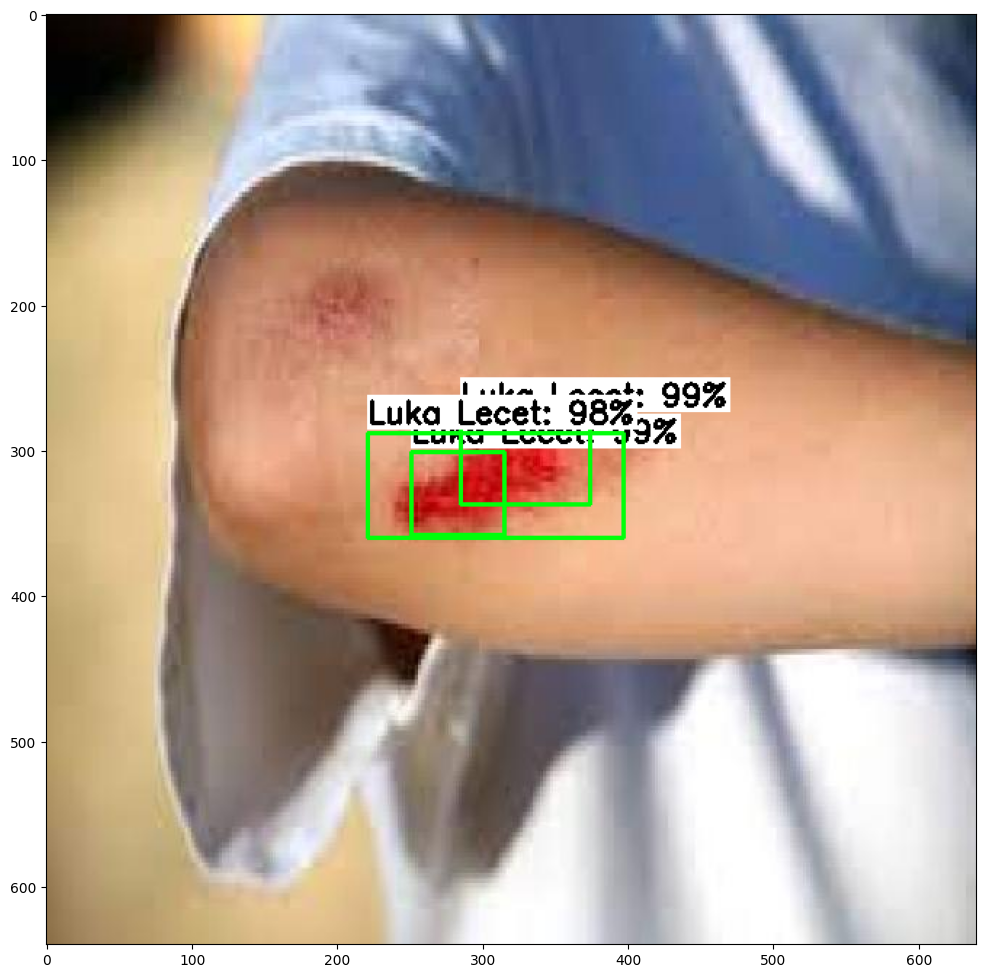

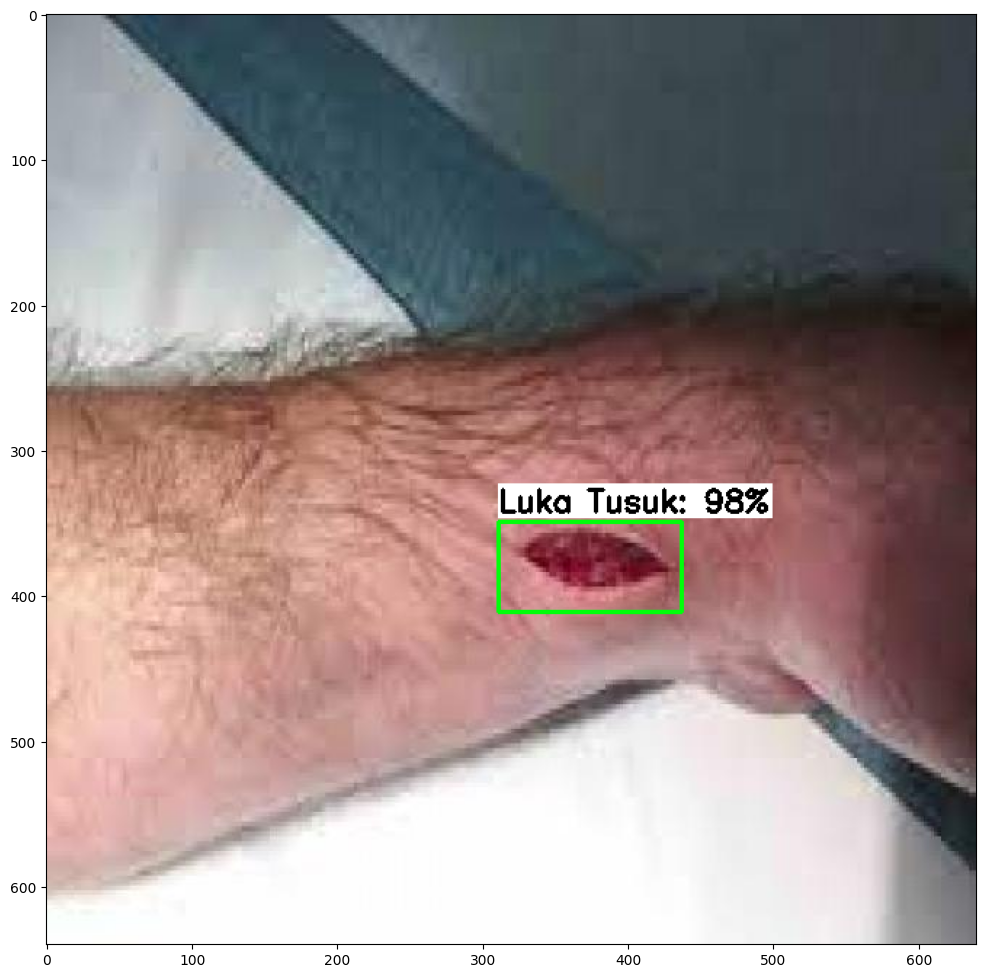

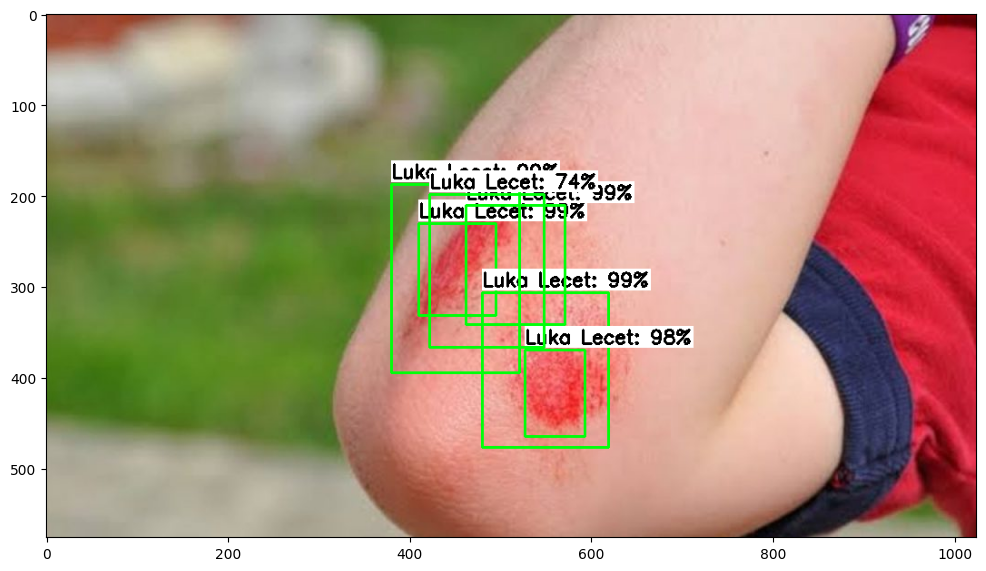

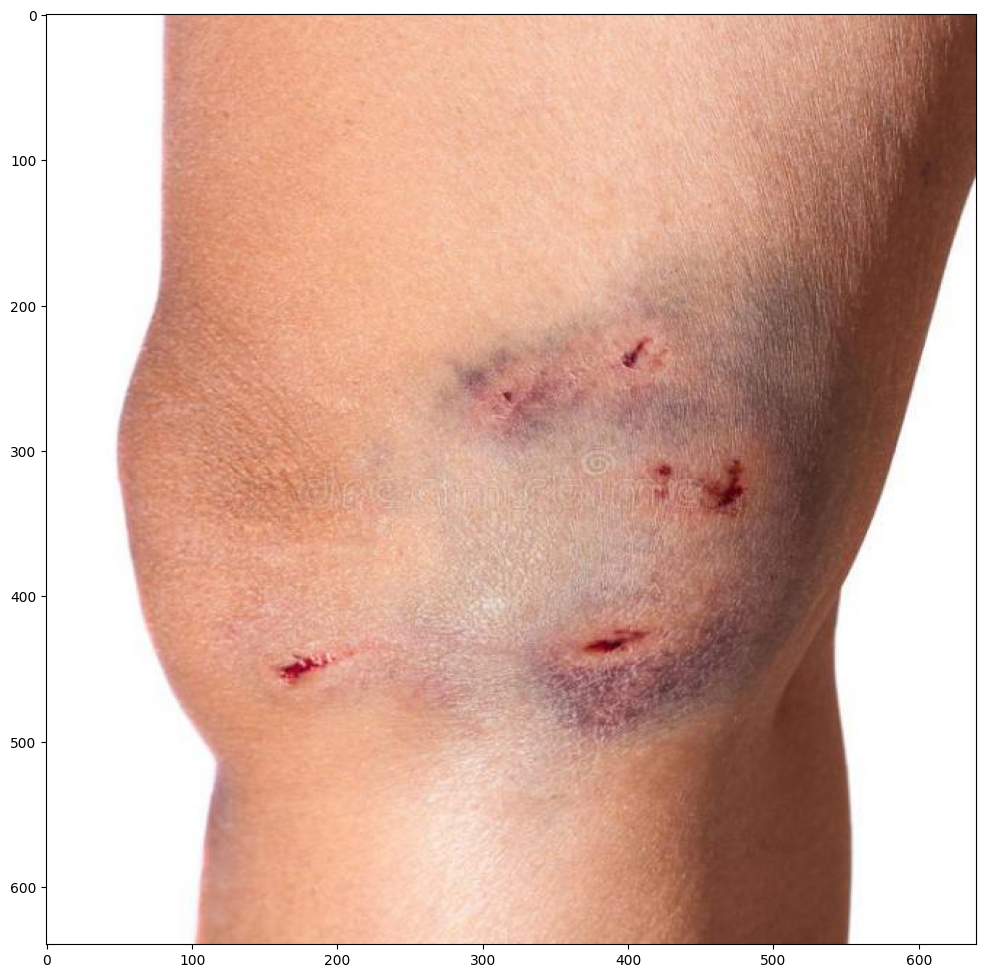

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.5   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

### 7.2 Menghitung mAP
Sekarang kita memiliki gambaran visual tentang bagaimana kinerja model kita pada gambar uji, tetapi bagaimana kita dapat mengukur akurasinya secara kuantitatif?

Salah satu metode yang populer untuk mengukur akurasi model pendeteksian objek adalah "mean average precision" (mAP). Pada dasarnya, semakin tinggi nilai mAP, semakin baik model Anda dalam mendeteksi objek dalam gambar. Untuk mempelajari lebih lanjut tentang mAP, baca [artikel dari Roboflow] (https://blog.roboflow.com/mean-average-precision/).

Kita akan menggunakan alat kalkulator mAP di https://github.com/Cartucho/mAP untuk menentukan skor mAP model kita. Pertama, kita perlu mengkloning repositori dan menghapus data contoh yang ada. Kita juga akan mengunduh skrip yang saya tulis untuk berinteraksi dengan kalkulator.

In [ ]:
%%bash
git clone https://github.com/Cartucho/mAP /content/mAP
cd /content/mAP
rm input/detection-results/*
rm input/ground-truth/*
rm input/images-optional/*
wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py

Cloning into '/content/mAP'...
--2023-12-10 09:53:02--  https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/calculate_map_cartucho.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5397 (5.3K) [text/plain]
Saving to: ‘calculate_map_cartucho.py’

     0K .....                                                 100% 38.7M=0s

2023-12-10 09:53:02 (38.7 MB/s) - ‘calculate_map_cartucho.py’ saved [5397/5397]



Selanjutnya, kita akan menyalin gambar dan data anotasi dari folder **test** ke folder yang sesuai di dalam repositori yang dikloning. Data ini akan digunakan sebagai "data kebenaran dasar" yang akan dibandingkan dengan hasil deteksi model kita.

In [ ]:
!cp /content/images/test/* /content/mAP/input/images-optional # Copy images and xml files
!mv /content/mAP/input/images-optional/*.xml /content/mAP/input/ground-truth/  # Move xml files to the appropriate folder

Alat bantu kalkulator mengharapkan data anotasi dalam format yang berbeda dengan format file .xml Pascal VOC yang kita gunakan. Untungnya, alat ini menyediakan sebuah skrip yang mudah, `convert_gt_xml.py`, untuk mengkonversi ke format .txt yang diharapkan.

In [ ]:
!python /content/mAP/scripts/extra/convert_gt_xml.py

Conversion completed!


Oke, kita telah menyiapkan data ground truth, tetapi sekarang kita membutuhkan hasil deteksi yang sebenarnya dari model kita. Hasil deteksi akan dibandingkan dengan data ground truth untuk menghitung akurasi model di mAP.

Fungsi inferensi yang telah kita definisikan pada Langkah 7.1 dapat digunakan untuk menghasilkan data deteksi untuk semua gambar pada folder **test**. Kita akan menggunakannya sama seperti sebelumnya, kecuali kali ini kita akan memerintahkannya untuk menyimpan hasil deteksi ke dalam folder `hasil-deteksi`.

Klik Play untuk menjalankan blok kode berikut ini!

Translated with www.DeepL.com/Translator (free version)

In [ ]:
# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Starting inference on 27 images...
Finished inferencing!


Terakhir, mari kita hitung mAP! Salah satu gaya yang populer untuk melaporkan mAP adalah metrik COCO untuk mAP @ 0,50:0,95. Pada dasarnya, ini berarti bahwa mAP dihitung pada beberapa ambang batas IoU antara 0,50 dan 0,95, dan kemudian hasil dari setiap ambang batas tersebut dirata-ratakan untuk mendapatkan skor mAP akhir. [Pelajari lebih lanjut di sini!] (https://blog.roboflow.com/mean-average-precision/)

Saya menulis skrip untuk menjalankan alat kalkulator di setiap ambang batas IoU, rata-rata hasilnya, dan melaporkan skor akurasi akhir. Skrip ini melaporkan mAP untuk setiap kelas dan mAP secara keseluruhan. Klik Play pada dua blok berikut untuk menghitung mAP!


In [ ]:
%cd /content/mAP
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

/content/mAP
Calculating mAP at 0.50 IoU threshold...
Error: File /content/mAP/input/ground-truth/a (116).txt in the wrong format.
 Expected: <class_name> <left> <top> <right> <bottom> ['difficult']
 Received: Luka Tusuk 1238 1730 2024 2344

If you have a <class_name> with spaces between words you should remove them
by running the script "remove_space.py" or "rename_class.py" in the "extra/" folder.
Traceback (most recent call last):
  File "/content/mAP/calculate_map_cartucho.py", line 97, in <module>
    with open('output/output.txt', 'r',) as f:
FileNotFoundError: [Errno 2] No such file or directory: 'output/output.txt'


Skor yang dilaporkan di bagian akhir adalah skor mAP model Anda secara keseluruhan. Idealnya, skor ini harus di atas 50% (0,50). Jika tidak, Anda dapat meningkatkan akurasi model Anda dengan menambahkan lebih banyak gambar ke dataset Anda. Lihat [video dataset] (https://www.youtube.com/watch?v=v0ssiOY6cfg) untuk tips tentang cara mengambil gambar pelatihan yang baik dan meningkatkan akurasi.

# 8.&nbsp;Deploy TensorFlow Lite Model

Sekarang model khusus Anda telah dilatih dan dikonversi ke format TFLite, model ini siap untuk diunduh dan digunakan dalam aplikasi! Bagian ini menunjukkan cara mengunduh model dan menyediakan tautan ke instruksi untuk menerapkannya di Raspberry Pi, PC Anda, atau perangkat edge lainnya.

## 8.1. Unduh model TFLite

Jalankan dua sel berikut untuk menyalin file labelmap ke dalam folder model, kompres ke dalam folder zip, lalu unduh. Folder zip berisi model `detect.tflite` dan file labelmap `labelmap.txt` yang diperlukan untuk menjalankan model dalam aplikasi Anda.

In [ ]:
# Move labelmap and pipeline config files into TFLite model folder and zip it up
!cp /content/labelmap.txt /content/custom_model_lite
!cp /content/labelmap.pbtxt /content/custom_model_lite
!cp /content/models/mymodel/pipeline_file.config /content/custom_model_lite

%cd /content
!zip -r custom_model_lite.zip custom_model_lite

/content
  adding: custom_model_lite/ (stored 0%)
  adding: custom_model_lite/pipeline_file.config (deflated 65%)
  adding: custom_model_lite/labelmap.txt (deflated 23%)
  adding: custom_model_lite/labelmap.pbtxt (deflated 54%)
  adding: custom_model_lite/detect.tflite (deflated 9%)
  adding: custom_model_lite/saved_model/ (stored 0%)
  adding: custom_model_lite/saved_model/saved_model.pb (deflated 91%)
  adding: custom_model_lite/saved_model/variables/ (stored 0%)
  adding: custom_model_lite/saved_model/variables/variables.index (deflated 78%)
  adding: custom_model_lite/saved_model/variables/variables.data-00000-of-00001 (deflated 9%)
  adding: custom_model_lite/saved_model/assets/ (stored 0%)


In [ ]:
from google.colab import files

files.download('/content/custom_model_lite.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The `custom_model_lite.zip` file containing the model will download into your Downloads folder. It's ready to be deployed on your device!

# 9.&nbsp;(Optional) Post-Training Quantization

Want to make your TFLite model run even faster? Quantize it! Quantizating a model converts its weights from 32-bit floating-point values to 8-bit integer values. This allows the quantized model to run faster and occupy less memory without too much reduction in accuracy.

> Note: If you observe an obvious decrease in detection accuracy when quantizing your model with TF2, I recommend using TensorFlow 1 to quantize your model instead. TF1 supports quantization-aware training, which helps improve the accuracy of quantized models. The ssd-mobilenet-v2-quantized model from the TF1 Model Zoo has fast and accurate performance when trained with a custom dataset. Visit my [TFLite v1 Colab notebook](https://colab.research.google.com/github/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Train_TFLite1_Object_Detection_Model.ipynb) for step-by-step instructions on how to train and quantize a model with TensorFlow 1.

## 9.1. Quantize model
We'll use the "TFLiteConverter" module to perform [post-training quantization](https://www.tensorflow.org/lite/performance/post_training_quantization) on the model. To quantize the model, we need to provide a representative dataset, which is a set of images that represent what the model will see when deployed in the field. First, we'll create a list of images to include in the representative dataset (we'll just use the images in the `train` folder).


In [ ]:
# Get list of all images in train directory
image_path = '/content/images/train'

jpg_file_list = glob.glob(image_path + '/*.jpg')
JPG_file_list = glob.glob(image_path + '/*.JPG')
png_file_list = glob.glob(image_path + '/*.png')
bmp_file_list = glob.glob(image_path + '/*.bmp')

quant_image_list = jpg_file_list + JPG_file_list + png_file_list + bmp_file_list

Next, we'll define a function to yield images from our representative dataset. Refer to [TensorFlow's sample quantization code](https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb#scrollTo=kRDabW_u1wnv) to get a better understanding of what this is doing!

In [ ]:
# A generator that provides a representative dataset
# Code modified from https://colab.research.google.com/github/google-coral/tutorials/blob/master/retrain_classification_ptq_tf2.ipynb

# First, get input details for model so we know how to preprocess images
interpreter = Interpreter(model_path=PATH_TO_MODEL) # PATH_TO_MODEL is defined in Step 7 above
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
height = input_details[0]['shape'][1]
width = input_details[0]['shape'][2]

import random

def representative_data_gen():
  dataset_list = quant_image_list
  quant_num = 300
  for i in range(quant_num):
    pick_me = random.choice(dataset_list)
    image = tf.io.read_file(pick_me)

    if pick_me.endswith('.jpg') or pick_me.endswith('.JPG'):
      image = tf.io.decode_jpeg(image, channels=3)
    elif pick_me.endswith('.png'):
      image = tf.io.decode_png(image, channels=3)
    elif pick_me.endswith('.bmp'):
      image = tf.io.decode_bmp(image, channels=3)

    image = tf.image.resize(image, [width, height])  # TO DO: Replace 300s with an automatic way of reading network input size
    image = tf.cast(image / 255., tf.float32)
    image = tf.expand_dims(image, 0)
    yield [image]

Finally, we'll initialize the TFLiteConverter module, point it at the TFLite graph we generated in Step 6, and provide it with the representative dataset generator function we created in the previous code block. We'll configure the converter to quantize the model's weight values to INT8 format.

In [ ]:
# Initialize converter module
converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')

# This enables quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
# This sets the representative dataset for quantization
converter.representative_dataset = representative_data_gen
# This ensures that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# For full integer quantization, though supported types defaults to int8 only, we explicitly declare it for clarity.
converter.target_spec.supported_types = [tf.int8]
# These set the input tensors to uint8 and output tensors to float32
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.float32
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect_quant.tflite', 'wb') as f:
  f.write(tflite_model)

## 9.2. Test quantized model
The model has been quantized and exported as `detect_quant.tflite`. Let's test it out! We'll re-use the function from Section 7 for running the model on test images and display the results, except this time we'll point it at the quantized model.

Click Play on the code block below to test the `detect_quant.tflite` model.

In [ ]:
# Set up parameters for inferencing function (using detect_quant.tflite instead of detect.tflite)
PATH_TO_IMAGES='/content/images/test'   #Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect_quant.tflite'   #Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   #Path to labelmap.txt file
min_conf_threshold=0.5   #Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 10   #Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)

If your quantized model isn't performing very well, try using my TensorFlow Lite 1 notebook *(link to be added)* to train a SSD-MobileNet model with your dataset. In my experience, the `ssd-mobilenet-v2-quantized` model from the [TF1 Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf1_detection_zoo.md) has the best quantized performance out of any other TensorFlow Lite model.

TFLite models created with TensorFlow 1 are still compatible with the TensorFlow Lite 2 runtime, so your TFLite 1 model will still work with my [TensorFlow setup guide for the Raspberry Pi](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Raspberry_Pi_Guide.md).

## 9.3 Calculate quantized model mAP

Let's calculate the quantize model's mAP using the calculator tool we set up in Step 7.2. We just need to perform inference with our quantized model (`detect_quant.tflite`) to get a new set of detection results.

Run the following block to run inference on the test images and save the detection results.

In [ ]:
# Need to remove existing detection results first
!rm /content/mAP/input/detection-results/*

# Set up variables for running inference, this time to get detection results saved as .txt files
PATH_TO_IMAGES='/content/images/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect_quant.tflite'   # Path to quantized .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
PATH_TO_RESULTS='/content/mAP/input/detection-results' # Folder to save detection results in
min_conf_threshold=0.1   # Confidence threshold

# Use all the images in the test folder
image_list = glob.glob(PATH_TO_IMAGES + '/*.jpg') + glob.glob(PATH_TO_IMAGES + '/*.JPG') + glob.glob(PATH_TO_IMAGES + '/*.png') + glob.glob(PATH_TO_IMAGES + '/*.bmp')
images_to_test = min(500, len(image_list)) # If there are more than 500 images in the folder, just use 500

# Tell function to just save results and not display images
txt_only = True

# Run inferencing function!
print('Starting inference on %d images...' % images_to_test)
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test, PATH_TO_RESULTS, txt_only)
print('Finished inferencing!')

Now we can run the mAP calculation script to determine our quantized model's mAP.

In [ ]:
cd /content/mAP

In [ ]:
!python calculate_map_cartucho.py --labels=/content/labelmap.txt

## 9.4. Compile model for Edge TPU

Now that the model has been converted to TFLite and quantized, we can compile it to run on Edge TPU devices like the [Coral USB Accelerator](https://coral.ai/products/accelerator/) or the [Coral Dev Board](https://coral.ai/products/dev-board/). This allows the model to run much faster! For information on how to set up the USB Accelerator, my [TensorFlow Lite repository on GitHub](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/deploy_guides/Raspberry_Pi_Guide.md#section-2---run-edge-tpu-object-detection-models-on-the-raspberry-pi-using-the-coral-usb-accelerator).

First, install the Edge TPU Compiler package inside this Colab instance.

In [ ]:
! curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -
! echo "deb https://packages.cloud.google.com/apt coral-edgetpu-stable main" | sudo tee /etc/apt/sources.list.d/coral-edgetpu.list
! sudo apt-get update
! sudo apt-get install edgetpu-compiler

Next, compile the quantize TFLite model. (If your model has a different filename than "detect_quant.tflite", use that instead.)

In [ ]:
%cd /content/custom_model_lite
!edgetpu_compiler detect_quant.tflite
!mv detect_quant_edgetpu.tflite edgetpu.tflite
!rm detect_quant_edgetpu.log

The compiled model will be output in the `custom_model_lite` folder as "detect__quant_edgetpu.tflite". It gets renamed to "edgetpu.tflite" to be consistent with my code. Zip the `custom_model_lite` folder and download it by running the two code blocks below.

In [ ]:
%cd /content
!zip -r custom_model_lite.zip custom_model_lite

In [ ]:
from google.colab import files

files.download('custom_model_lite.zip')

Now you're all set to use the Coral model! For instructions on how to run an object detection model on the Raspberry Pi using the Coral USB Acclerator, please see my video, ["How to Use the Coral USB Accelerator with the Raspberry Pi"](https://www.youtube.com/watch?v=qJMwNHQNOVU).

# Appendix: Common Errors

Here are solutions to common errors that can occur while stepping through this notebook.

**1. Training suddenly stops with ^C output**

If your training randomly stops without any error messages except a `^C`, that means the virtual machine has run out of memory. To resolve the issue, try reducing the `batch_size` variable in Step 4 to a lower value like `batch_size = 4`. The value must be a power of 2. (e.g. 2, 4, 8 ...)

Source: https://stackoverflow.com/questions/75901898/why-my-model-training-automatically-stopped-during-training